# <p><center style="font-family:newtimeroman;font-size:180%;">Face Mask Detection and Quality Evaluation Using Image Analysis </center></p>
### Table of contents:

* [Import Libraries](#1)
* [Read Data](#2)
* [Visualization Of Dataset](#3)
* [Data Augmentation](#4)
* [MobileNetV2 Model](#5)
* [Evaluate The Model](#6)

**<a id="1"></a>
# <p style="background-image: url(https://i.postimg.cc/K87ByXmr/stage5.jpg);font-family:camtasia;font-size:120%;color:white;text-align:center;border-radius:15px 50px; padding:7px">Import Libraries </p>
<a class="btn" href="#home">Tabel of Contents</a>

In [1]:
import os 
import cv2
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from keras.preprocessing.image import ImageDataGenerator
import keras 
from keras.callbacks import EarlyStopping,ModelCheckpoint
import tensorflow as tf
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from tqdm import tqdm

**<a id="2"></a>
# <p style="background-image: url(https://i.postimg.cc/K87ByXmr/stage5.jpg);font-family:camtasia;font-size:120%;color:white;text-align:center;border-radius:15px 50px; padding:7px">Read Data </p>
<a class="btn" href="#home">Tabel of Contents</a>

In [2]:
images = []
labels = []
for subfolder in tqdm(os.listdir('/kaggle/input/face-mask-dataset/data')):
    subfolder_path = os.path.join('/kaggle/input/face-mask-dataset/data', subfolder)
    if not os.path.isdir(subfolder_path):
        continue
    for image_filename in os.listdir(subfolder_path):
        image_path = os.path.join(subfolder_path, image_filename)
        images.append(image_path)
        labels.append(subfolder)
df = pd.DataFrame({'image': images, 'label': labels})
df

100%|██████████| 2/2 [00:00<00:00,  8.01it/s]


,image,label
0,/kaggle/input/face-mask-dataset/data/without_m...,without_mask
1,/kaggle/input/face-mask-dataset/data/without_m...,without_mask
2,/kaggle/input/face-mask-dataset/data/without_m...,without_mask
3,/kaggle/input/face-mask-dataset/data/without_m...,without_mask
4,/kaggle/input/face-mask-dataset/data/without_m...,without_mask
...,...,...
7548,/kaggle/input/face-mask-dataset/data/with_mask...,with_mask
7549,/kaggle/input/face-mask-dataset/data/with_mask...,with_mask
7550,/kaggle/input/face-mask-dataset/data/with_mask...,with_mask
7551,/kaggle/input/face-mask-dataset/data/with_mask...,with_mask


**<a id="3"></a>
# <p style="background-image: url(https://i.postimg.cc/K87ByXmr/stage5.jpg);font-family:camtasia;font-size:120%;color:white;text-align:center;border-radius:15px 50px; padding:7px">Visualization of Dataset </p>
<a class="btn" href="#home">Tabel of Contents</a>

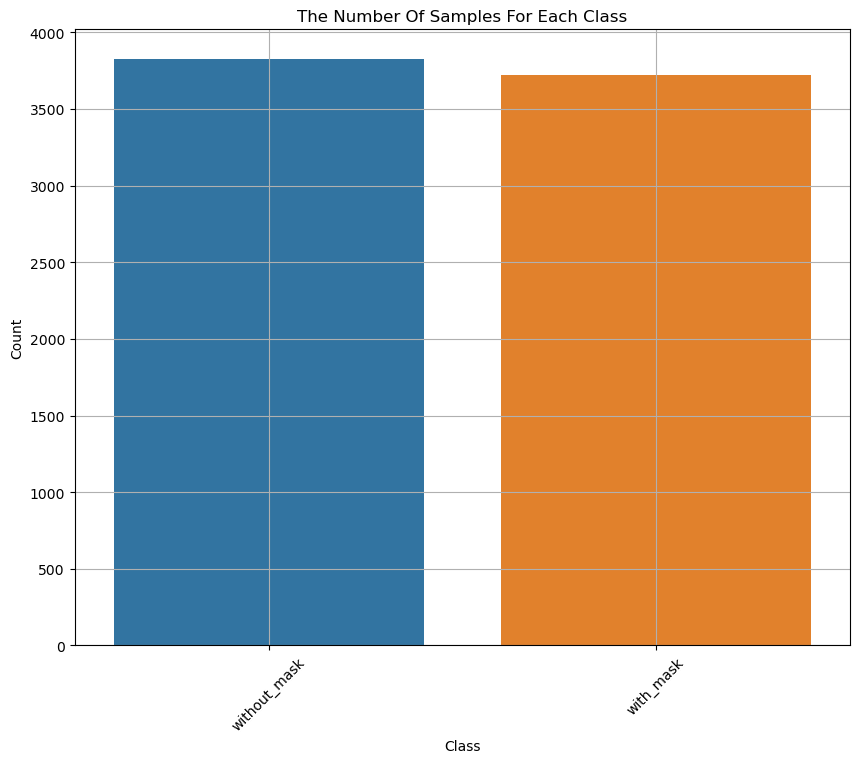

In [3]:
plt.figure(figsize=(10,8))
ax = sns.countplot(x=df.label)
ax.set_xlabel("Class")
ax.set_ylabel("Count")
plt.title('The Number Of Samples For Each Class')
plt.grid(True)
plt.xticks(rotation=45)
plt.show()

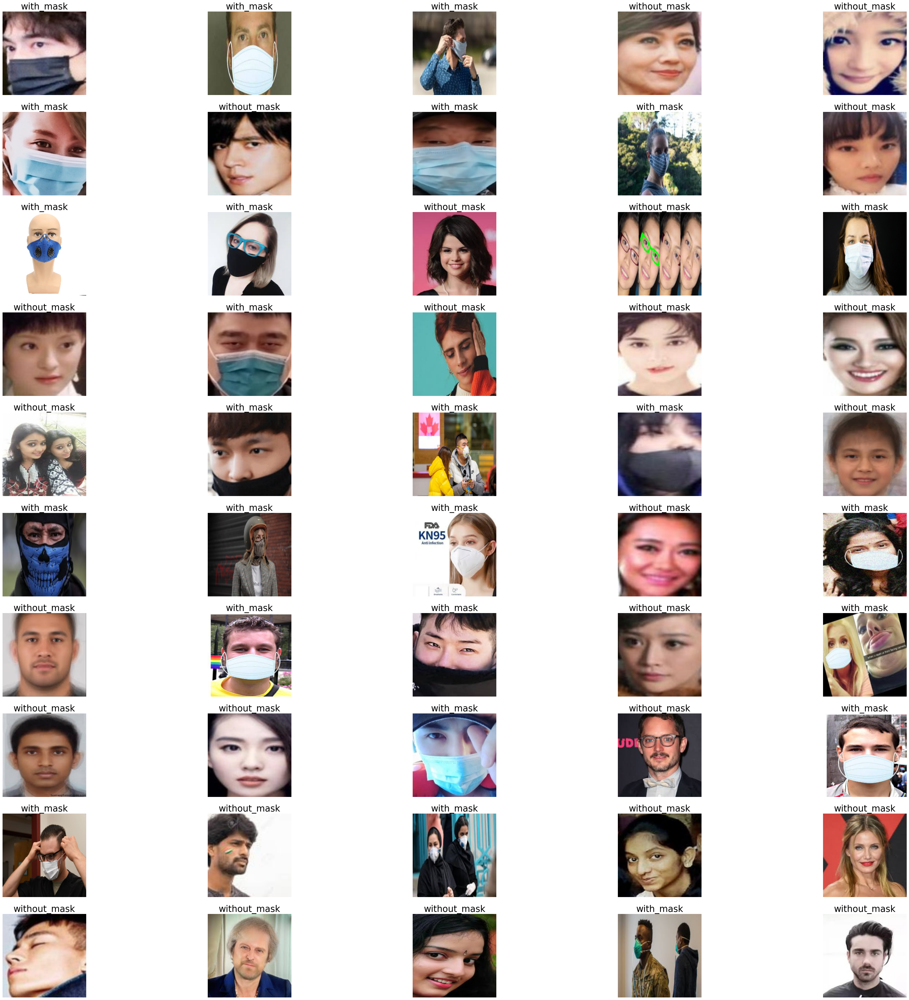

In [4]:
plt.figure(figsize=(50,50))
for n,i in enumerate(np.random.randint(0,len(df),50)):
    plt.subplot(10,5,n+1)
    img=cv2.imread(df.image[i])
    img=cv2.resize(img,(224,224))
    img=cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    plt.imshow(img)
    plt.axis('off')
    plt.title(df.label[i],fontsize=25)

<a id="4"></a>
# <p style="background-image: url(https://i.postimg.cc/K87ByXmr/stage5.jpg);font-family:camtasia;font-size:120%;color:white;text-align:center;border-radius:15px 50px; padding:7px"> Data Augmentation </p>
<a class="btn" href="#home">Tabel of Contents</a>

In [5]:
X_train, X_test1, y_train, y_test1 = train_test_split(df['image'], df['label'], test_size=0.3, random_state=42,shuffle=True,stratify=df['label'])
X_val, X_test, y_val, y_test = train_test_split(X_test1,y_test1, test_size=0.5, random_state=42,shuffle=True,stratify=y_test1)
df_train = pd.DataFrame({'image': X_train, 'label': y_train})
df_test = pd.DataFrame({'image': X_test, 'label': y_test})
df_val = pd.DataFrame({'image': X_val, 'label': y_val})

In [6]:
image_size = (224,224)
batch_size = 32
datagen = ImageDataGenerator(
    rescale=1./255
)
train_generator = datagen.flow_from_dataframe(
    df_train,
    x_col='image',
    y_col='label',
    target_size=image_size,
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=True
)
test_generator = datagen.flow_from_dataframe(
    df_test,
    x_col='image',
    y_col='label',
    target_size=image_size,
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=False
)
val_generator = datagen.flow_from_dataframe(
    df_val,
    x_col='image',
    y_col='label',
    target_size=image_size,
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=True
)

Found 5287 validated image filenames belonging to 2 classes.
Found 1133 validated image filenames belonging to 2 classes.
Found 1133 validated image filenames belonging to 2 classes.


<a id="5"></a>
# <p style="background-image: url(https://i.postimg.cc/K87ByXmr/stage5.jpg);font-family:camtasia;font-size:120%;color:white;text-align:center;border-radius:15px 50px; padding:7px"> Modeling </p>
<a class="btn" href="#home">Tabel of Contents</a>

In [7]:
base_model = tf.keras.applications.MobileNetV2(input_shape=(224,224,3),include_top=False,weights='imagenet')
base_model.trainable = False
model=keras.models.Sequential()
model.add(base_model)
model.add(keras.layers.Flatten()) 
model.add(keras.layers.Dense(256,activation=tf.nn.relu))
model.add(keras.layers.Dropout(.3))
model.add(keras.layers.Dense(2,activation=tf.nn.softmax))
model.summary()

9406464/9406464 [==============================] - 0s 0us/step
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 mobilenetv2_1.00_224 (Funct  (None, 7, 7, 1280)       2257984   
 ional)                                                          
                                                                 
 flatten (Flatten)           (None, 62720)             0         
                                                                 
 dense (Dense)               (None, 256)               16056576  
                                                                 
 dropout (Dropout)           (None, 256)               0         
                                                                 
 dense_1 (Dense)             (None, 2)                 514       
                                                                 
Total params: 18,315,074
Trainable params: 16,057,090
Non-t

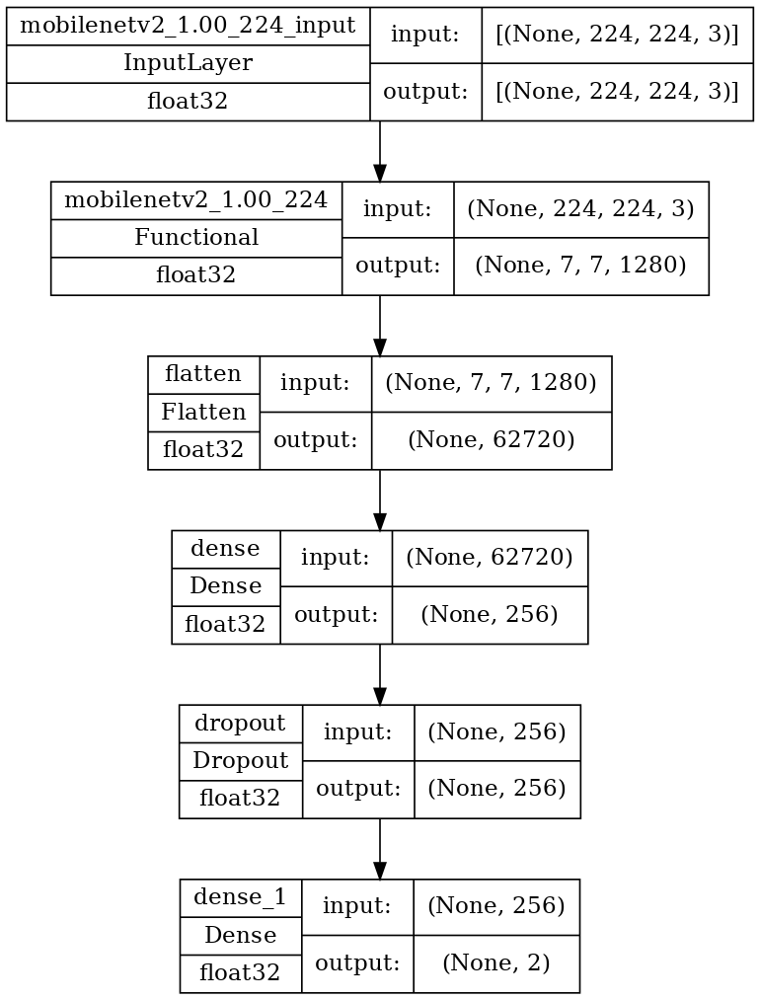

In [8]:
tf.keras.utils.plot_model(model, to_file='model.png', show_shapes=True, show_layer_names=True,show_dtype=True,dpi=120)

In [9]:
checkpoint_cb =ModelCheckpoint("face_model.h5", save_best_only=True)
early_stopping_cb =EarlyStopping(patience=5, restore_best_weights=True)
model.compile(optimizer ='adam', loss='categorical_crossentropy', metrics=['accuracy'])
hist = model.fit(train_generator, epochs=20, validation_data=val_generator, callbacks=[checkpoint_cb, early_stopping_cb])

Epoch 1/20
  6/166 [>.............................] - ETA: 39s - loss: 6.2454 - accuracy: 0.7656

/opt/conda/lib/python3.7/site-packages/PIL/Image.py:960: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


166/166 [==============================] - 69s 337ms/step - loss: 0.7097 - accuracy: 0.9711 - val_loss: 0.2814 - val_accuracy: 0.9876
Epoch 2/20
166/166 [==============================] - 29s 174ms/step - loss: 0.2523 - accuracy: 0.9871 - val_loss: 0.2766 - val_accuracy: 0.9850
Epoch 3/20
166/166 [==============================] - 29s 173ms/step - loss: 0.1884 - accuracy: 0.9907 - val_loss: 0.4992 - val_accuracy: 0.9762
Epoch 4/20
166/166 [==============================] - 29s 172ms/step - loss: 0.0727 - accuracy: 0.9930 - val_loss: 0.2534 - val_accuracy: 0.9876
Epoch 5/20
166/166 [==============================] - 29s 172ms/step - loss: 0.0491 - accuracy: 0.9966 - val_loss: 0.2786 - val_accuracy: 0.9859
Epoch 6/20
166/166 [==============================] - 28s 169ms/step - loss: 0.0567 - accuracy: 0.9966 - val_loss: 0.4435 - val_accuracy: 0.9841
Epoch 7/20
166/166 [==============================] - 29s 174ms/step - loss: 0.0249 - accuracy: 0.9968 - val_loss: 0.6675 - val_accuracy: 0.9

<a id="6"></a>
# <p style="background-image: url(https://i.postimg.cc/K87ByXmr/stage5.jpg);font-family:camtasia;font-size:120%;color:white;text-align:center;border-radius:15px 50px; padding:7px"> Evaluate The Model  </p>
<a class="btn" href="#home">Tabel of Contents</a>

In [10]:
hist_=pd.DataFrame(hist.history)
hist_

,loss,accuracy,val_loss,val_accuracy
0,0.709674,0.971061,0.281390,0.987643
1,0.252349,0.987138,0.276582,0.984996
2,0.188437,0.990732,0.499157,0.976169
3,0.072661,0.993002,0.253370,0.987643
4,0.049070,0.996595,0.278649,0.985878
5,0.056719,0.996595,0.443453,0.984113
6,0.024884,0.996785,0.667487,0.977935
7,0.066146,0.995271,0.346535,0.986761
8,0.034639,0.997919,0.385437,0.986761


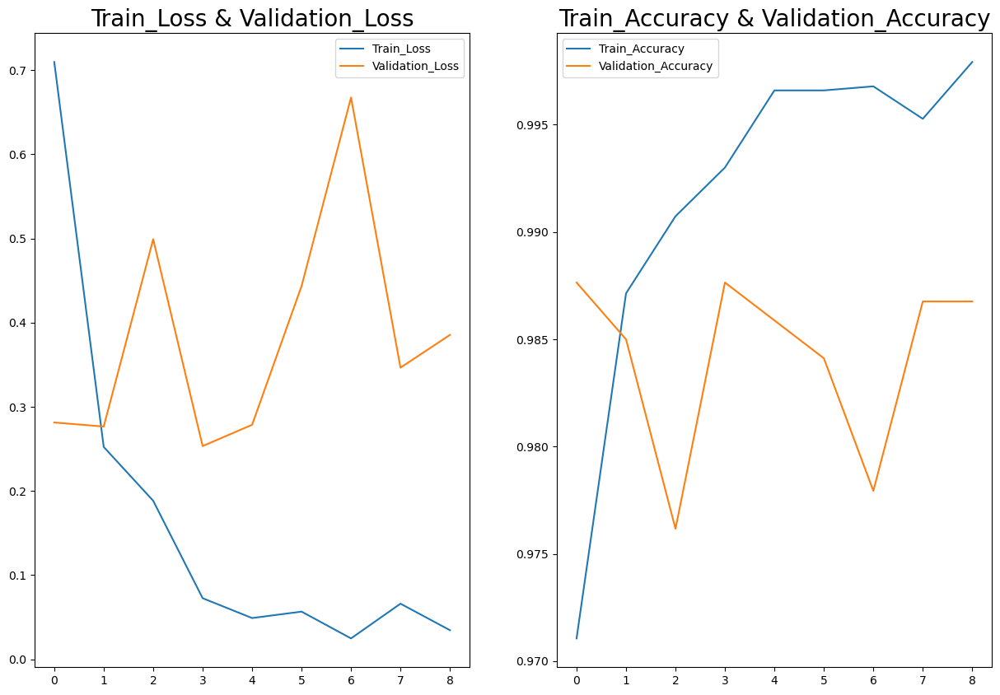

In [11]:
plt.figure(figsize=(15,10))
plt.subplot(1,2,1)
plt.plot(hist_['loss'],label='Train_Loss')
plt.plot(hist_['val_loss'],label='Validation_Loss')
plt.title('Train_Loss & Validation_Loss',fontsize=20)
plt.legend()
plt.subplot(1,2,2)
plt.plot(hist_['accuracy'],label='Train_Accuracy')
plt.plot(hist_['val_accuracy'],label='Validation_Accuracy')
plt.title('Train_Accuracy & Validation_Accuracy',fontsize=20)
plt.legend()
plt.show()

In [12]:
score, acc= model.evaluate(test_generator)
print('Test Loss =', score)
print('Test Accuracy =', acc)

36/36 [==============================] - 9s 257ms/step - loss: 0.2293 - accuracy: 0.9885
Test Loss = 0.22930999100208282
Test Accuracy = 0.9885260462760925


In [13]:
y_test =test_generator.classes
predictions = model.predict(test_generator)
y_pred = np.argmax(predictions,axis=1)
y_test = np.ravel(y_test)
y_pred = np.ravel(y_pred)
df = pd.DataFrame({'Actual': y_test, 'Prediction': y_pred})
df

36/36 [==============================] - 5s 125ms/step


,Actual,Prediction
0,0,0
1,0,0
2,0,0
3,0,0
4,1,1
...,...,...
1128,0,0
1129,1,1
1130,0,0
1131,1,1


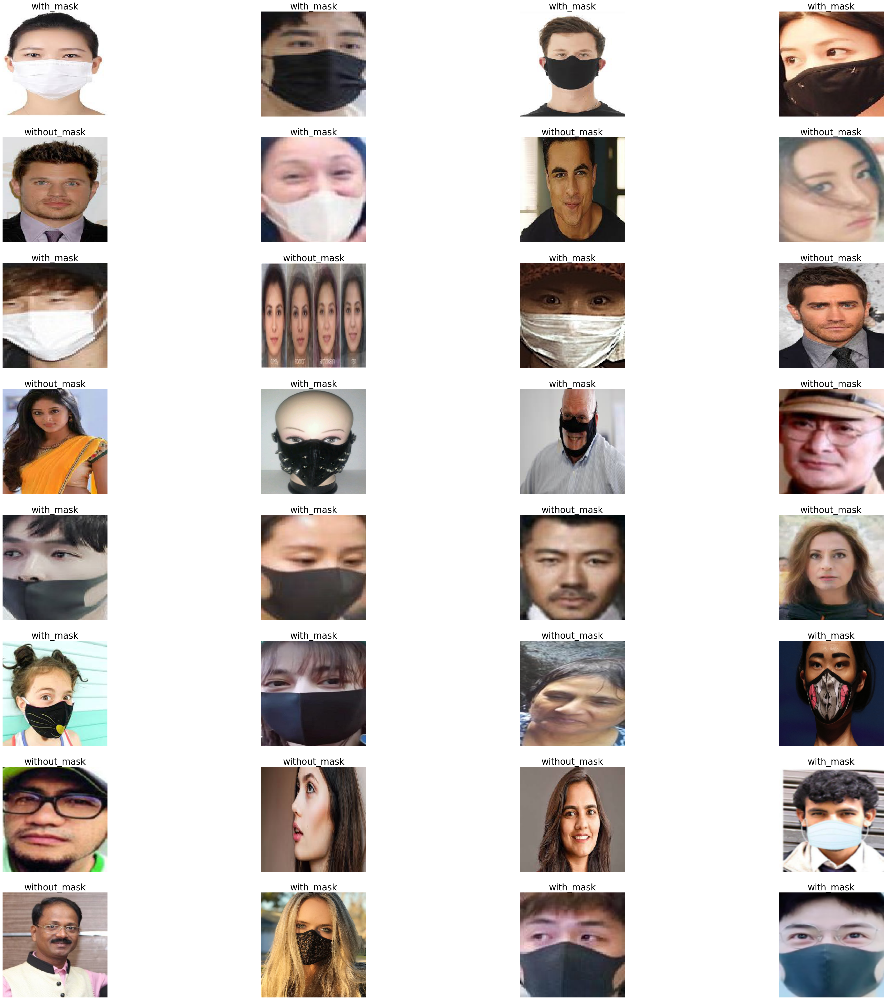

In [14]:
class_names=['with_mask', 'without_mask']
batch = next(test_generator)
images= batch[0]
plt.figure(figsize=(50,50))
for n in range(32):
    plt.subplot(8,4,n+1)
    plt.imshow(images[n])
    plt.axis('off')
    plt.title(class_names[int(y_test[n])],fontsize=25)

array([[558,   1],
       [ 12, 562]])

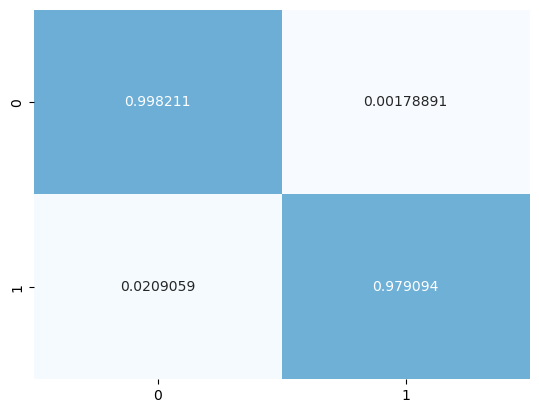

In [15]:
CM = confusion_matrix(y_test,y_pred)
CM_percent = CM.astype('float') / CM.sum(axis=1)[:, np.newaxis]
sns.heatmap(CM_percent,fmt='g',center = True,cbar=False,annot=True,cmap='Blues')
CM

In [16]:
ClassificationReport = classification_report(y_test,y_pred)
print('Classification Report is : ', ClassificationReport )

Classification Report is :                precision    recall  f1-score   support

           0       0.98      1.00      0.99       559
           1       1.00      0.98      0.99       574

    accuracy                           0.99      1133
   macro avg       0.99      0.99      0.99      1133
weighted avg       0.99      0.99      0.99      1133

